In [2]:
import pandas as pd
import numpy as np
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

In [3]:
data=pd.read_csv('data/data.csv')
genre_data=pd.read_csv('data/data_by_genres.csv')
year_data=pd.read_csv('data/data_by_year.csv')


In [4]:
print(data.shape)
print(genre_data.shape)
print(year_data.shape)

(170653, 19)
(2973, 14)
(100, 14)


In [5]:
data.columns

Index(['valence', 'year', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'explicit', 'id', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'name', 'popularity', 'release_date',
       'speechiness', 'tempo'],
      dtype='object')

In [45]:
data.describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,cluster
count,170653.000000,170653.000000,170653.000000,170653.000000,1.706530e+05,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000
mean,0.528587,1976.787241,0.502115,0.537396,2.309483e+05,0.482389,0.084575,0.167010,5.199844,0.205839,-11.467990,0.706902,31.431794,0.098393,116.861590,3.053348
std,0.263171,25.917853,0.376032,0.176138,1.261184e+05,0.267646,0.278249,0.313475,3.515094,0.174805,5.697943,0.455184,21.826615,0.162740,30.708533,1.662973
min,0.000000,1921.000000,0.000000,0.000000,5.108000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.317000,1956.000000,0.102000,0.415000,1.698270e+05,0.255000,0.000000,0.000000,2.000000,0.098800,-14.615000,0.000000,11.000000,0.034900,93.421000,2.000000
50%,0.540000,1977.000000,0.516000,0.548000,2.074670e+05,0.471000,0.000000,0.000216,5.000000,0.136000,-10.580000,1.000000,33.000000,0.045000,114.729000,3.000000
75%,0.747000,1999.000000,0.893000,0.668000,2.624000e+05,0.703000,0.000000,0.102000,8.000000,0.261000,-7.183000,1.000000,48.000000,0.075600,135.537000,5.000000
max,1.000000,2020.000000,0.996000,0.988000,5.403500e+06,1.000000,1.000000,1.000000,11.000000,1.000000,3.855000,1.000000,100.000000,0.970000,243.507000,6.000000


In [46]:
genre_data.describe()

,mode,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
count,2973.000000,2973.000000,2973.000000,2.973000e+03,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000
mean,0.833165,0.401241,0.537187,2.517209e+05,0.561143,0.211366,0.192800,-10.509848,0.083588,119.018723,0.492748,39.919185,5.938782
std,0.372891,0.319760,0.150668,9.465686e+04,0.234486,0.267329,0.092356,5.369202,0.080483,17.469188,0.201820,16.748723,3.368110
min,0.000000,0.000003,0.056900,3.094600e+04,0.001002,0.000000,0.022200,-41.825000,0.023800,47.135722,0.003353,0.000000,0.000000
25%,1.000000,0.119050,0.441202,2.063788e+05,0.395058,0.004835,0.137687,-12.427656,0.044900,109.198143,0.348578,32.491279,3.000000
50%,1.000000,0.321745,0.546496,2.375453e+05,0.601195,0.080700,0.178764,-9.221817,0.059457,119.194167,0.500048,43.056569,7.000000
75%,1.000000,0.673991,0.647500,2.772720e+05,0.730127,0.343333,0.220856,-6.920125,0.091000,127.508750,0.640257,51.138889,9.000000
max,1.000000,0.996000,0.929000,2.382587e+06,0.994667,0.992000,0.960000,0.060000,0.946219,204.212000,0.980000,80.666667,11.000000


In [47]:
year_data.describe()

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
count,100.0,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.0000
mean,1.0,1970.500000,0.556317,0.536783,227296.752234,0.452705,0.193582,0.208224,-11.969054,0.105861,116.015674,0.532120,27.376065,3.7900
std,0.0,29.011492,0.275358,0.052356,25630.048065,0.161738,0.122488,0.017903,3.105610,0.082128,5.669645,0.057809,20.703197,3.5627
min,1.0,1921.000000,0.219931,0.414445,156881.657475,0.207948,0.016376,0.168450,-19.275282,0.049098,100.884521,0.379327,0.140845,0.0000
25%,1.0,1945.750000,0.289516,0.500800,210889.193536,0.280733,0.103323,0.197509,-14.189232,0.064244,111.718626,0.497174,3.298200,0.0000
50%,1.0,1970.500000,0.459190,0.540976,235520.850833,0.495997,0.127644,0.206074,-11.773061,0.085763,117.455548,0.541503,33.619250,2.0000
75%,1.0,1995.250000,0.856711,0.570948,247702.738058,0.598008,0.276707,0.218493,-9.950542,0.104438,120.606644,0.570080,44.943375,7.0000
max,1.0,2020.000000,0.962607,0.692904,267677.823086,0.681778,0.581701,0.264335,-6.595067,0.490001,124.283129,0.663725,65.256542,10.0000


In [7]:
print(data.columns)
print(genre_data.columns)
print(year_data.columns)

Index(['valence', 'year', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'explicit', 'id', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'name', 'popularity', 'release_date',
       'speechiness', 'tempo'],
      dtype='object')
Index(['mode', 'genres', 'acousticness', 'danceability', 'duration_ms',
       'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness',
       'tempo', 'valence', 'popularity', 'key'],
      dtype='object')
Index(['mode', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence', 'popularity', 'key'],
      dtype='object')


In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

<Axes: >

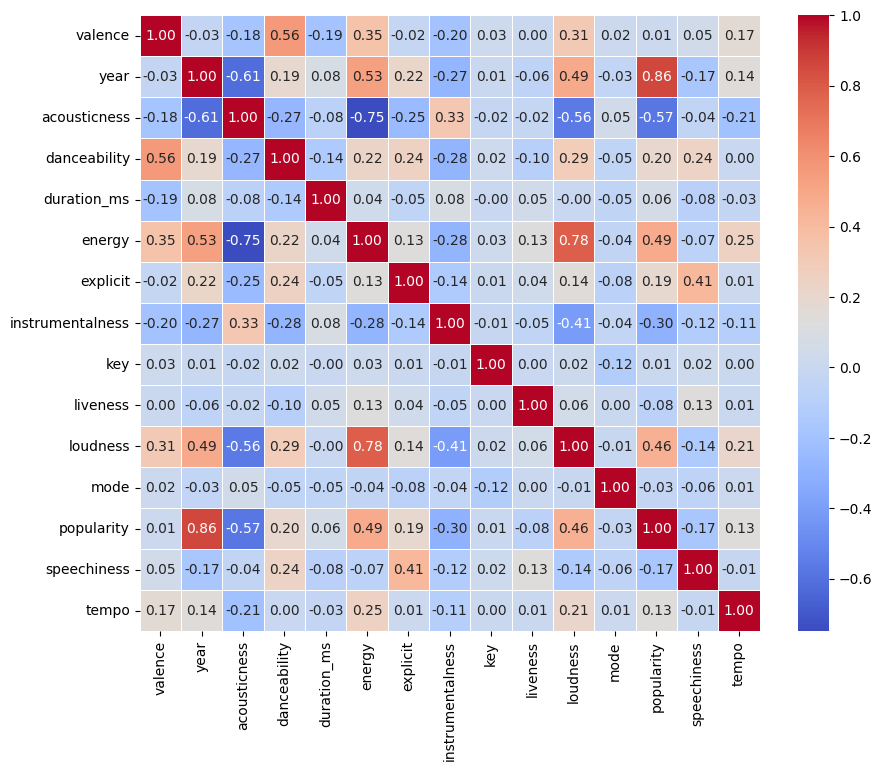

In [10]:
plt.figure(figsize=(10,8))
sns.heatmap(data.corr(numeric_only=True),cmap='coolwarm',annot=True,linewidths=0.5,fmt='.2f')

### strongly correlated features

In [4]:
features=data[['valence', 'year', 'acousticness', 'danceability',
        'energy', 'explicit',
      'loudness', 'popularity',
       'speechiness']]

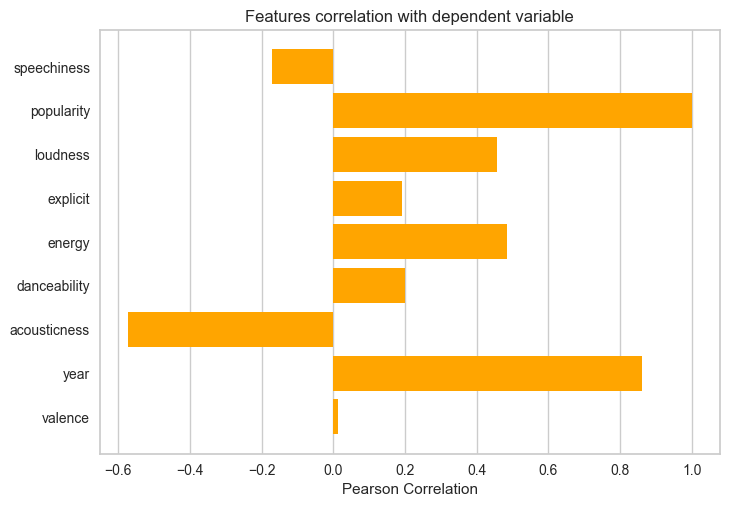

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [56]:
from yellowbrick.target import FeatureCorrelation

columns = np.array(['valence', 'year', 'acousticness', 'danceability',
        'energy', 'explicit',
      'loudness', 'popularity',
       'speechiness'])
x, y = features, data['popularity']
visualizer = FeatureCorrelation(labels=columns,color='orange')
visualizer.fit(x, y)    
visualizer.show()

## Elbow method for optimal number of clusters

In [12]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

wcss=[]

scaler=StandardScaler()
correlated_features=scaler.fit_transform(features.values)

for i in range(1,50):
    kmm=KMeans(n_clusters=i,init='k-means++',random_state=42,n_init='auto')
    kmm.fit(correlated_features)
    wcss.append(kmm.inertia_)

In [13]:
import plotly.graph_objects as go

fig = go.Figure(go.Scatter(
    x = [i for i in range(1,50)],
    y = wcss
))

fig.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    )
)

fig.show()

## 7 are the optimal number of clusters

In [14]:
from sklearn.pipeline import Pipeline

steps=[('scaler',StandardScaler()),('kmeans',KMeans(n_clusters=7,init='k-means++',random_state=42,n_init='auto'))]

model=Pipeline(steps=steps)
model.fit(features)
data['cluster']=model.predict(features)

data.head()


,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,cluster
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954,2
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936,3
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339,2
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109,2
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665,2


## Dimensionality reduction for visualizing the clusters

In [15]:
from sklearn.decomposition import PCA

pipe=Pipeline(steps=[('scaler',StandardScaler()),('pca',PCA(n_components=2))])

xy=pipe.fit_transform(features)


In [16]:
fig=px.scatter(x=xy[:,0],y=xy[:,1],color=data['cluster'])
fig.show()

## euclidean distance between song and other data points in dataset

In [5]:
from scipy.spatial.distance import euclidean

def find_distance(point,dataset):
    numeric_cols=dataset.select_dtypes(np.number)
    point=point[numeric_cols.columns]
    distance=[]
    
    for i,row in numeric_cols.iterrows():
        distance.append(euclidean(point.values.flatten(),row.values.flatten()))
        
    return distance  

## Top 10 closest songs for the entered song

In [26]:
def recommendation_using_clusters(song_name):
    
    song=data[data['name']==song_name].iloc[0]
    song_cluster=data[data['cluster']==song.cluster]

    distances=find_distance(song,song_cluster)
    song_cluster['distance']=distances
    
    return song_cluster.sort_values('distance').head(10)[['name','artists','release_date']]

recommendation_using_clusters(song_name='Sleep Rain')



,name,artists,release_date,distance
37461,Sleep Rain,[Sound Library XL],2014-12-02,0.000000
130619,Church by the Side of the Road,[Johnny Horton],1969-12-22,118.389475
138057,"Flute Concerto in D Major, RV 429: II. Andante","[Antonio Vivaldi, Emmanuel Pahud]",2006-03-06,132.171108
65420,Finale,"[John Williams, Isaac Stern, ""Fiddler On The R...",1971-08-24,140.392397
8837,April Come She Will,[Simon & Garfunkel],1966-01-17,284.437800
8444,I'll Follow The Sun - Remastered 2009,[The Beatles],1964-12-04,308.366813
118918,"The Nutcracker Suite, Op. 71A, Dance Of The Re...","[Leopold Stokowski, Philadelphia Orchestra]",1990-01-01,315.398085
8041,Hark! The Herald Angels Sing,[Nat King Cole],1962,347.879365
69622,Elk Hunt,[Trevor Jones],1992-01-01,357.754006
50902,Behind the Wall,[Tracy Chapman],1988-04-05,410.047499


In [6]:
def str_tolist(s):
    l=s.strip('[]').split(",")
    res = [ele.strip(" ' ") for ele in l]
    return res    

data.artists=data.artists.apply(str_tolist)

## top 10 nearest song values for a particular artist

In [15]:
def recommend_song_using_artist(song_name):
    index=data[data['name']==song_name].index[0]
    song=data.iloc[index,:]
    

    
    artists=set(song['artists'])

    
    for artist in artists:
        indices=data[data.artists.apply(lambda x: artist in x)].index
        
        artist_cluster=data.iloc[indices]
        distances=find_distance(song,artist_cluster)
        
        artist_cluster['distance']=distances
        
        print('\nArtist name:',artist)
        artist_cluster.drop(index,inplace=True)
        
        print(artist_cluster.sort_values('distance')[['name','artists','release_date']].head(10))  
        
recommend_song_using_artist(song_name='Finale')     
    


Artist name: Alfred Drake
                                                    name  \
4232                       People Will Say We're In Love   
41932  The Surrey With The Fringe On Top - Alternate ...   
4244                   The Surrey With The Fringe On Top   
25350                              Finale: Sands of Time   
4318                             Finale - Alternate Take   
4264                                    Pore Jud Is Daid   
24275                    Wunderbar (from "Kiss Me Kate")   
24526                           Kiss Me, Kate: Wunderbar   
78215                           Kiss Me, Kate: Wunderbar   
4276                                         Lonely Room   

                                                 artists release_date  
4232                        [Alfred Drake, Joan Roberts]   1943-12-02  
41932                                     [Alfred Drake]   1943-12-02  
4244                                      [Alfred Drake]   1943-12-02  
25350  [Alfred Drake, Ri

## Recommending song in the same particular year

In [34]:
def recommend_song_using_year(song_name):
    index=data[data['name']==song_name].index[0]
    song=data.loc[index,:]
    
    year_cluster=data[data['year']==song.year]
    
    distances=find_distance(song,year_cluster)
    year_cluster['distance']=distances
    year_cluster.drop(index,inplace=True)
    
    return year_cluster.sort_values('distance').head(10)[['name','artists','release_date']]

recommend_song_using_year(song_name='La Mina del Ford - Remasterizado')

,name,artists,release_date,distance
445,A Sun-Kist Cottage In California,[George Olsen],1924-01-01,464.322394
408,Low Gravy,"[The Chenille Sisters, ""James Dapogny's Chicag...",1924,751.163133
451,Olga - Remasterizado,[Ignacio Corsini],1924-03-29,910.888647
442,A Lo Lejos - Remasterizado,[Ignacio Corsini],1924-03-29,1172.196120
19811,Ernestine tu t'obstines,[Dranem],1924,1764.309831
553,Un Metejón - Remasterizado,[Francisco Canaro],1924-07-12,2374.953507
19806,Shangai Bay - Remasterizado,[Ignacio Corsini],1924-03-29,4920.000143
573,Madame Pompadour - Remasterizado,[Francisco Canaro],1924-07-11,5282.110560
583,Ca n'est pas la même chose,[Maurice Chevalier],1924,5346.708552
576,Sombras - Remasterizado,[Ignacio Corsini],1924-03-29,5814.371140
